In [38]:
import numpy as np
import matplotlib.pyplot as plt
from numba import jit, prange
from scipy.stats import qmc
from scipy.stats import norm

In [39]:
SAVE_DIR = 'media/'
os.makedirs(SAVE_DIR, exist_ok=True)
X_LIM = (-2, 0.75)
Y_LIM = (-1.25, 1.25)

In [40]:
# Checking if a point is part of the mandelbrot set
@jit(nopython=True)
def mandelbrot(z, max_iter):
    c = z
    for i in range(max_iter):
        if np.abs(z) > 2:
            return i
        z = z*z + c
    return max_iter

# Utility to calculate statistics of generated set
def mandelbrot_statistics(c_points, counts, method):
    total_area = abs(X_LIM[0] - X_LIM[1])*abs(Y_LIM[0] - Y_LIM[1])
    max_iter = np.max(counts)
    mandelbrot_ratio = np.count_nonzero(counts == max_iter) / counts.size
    mandelbrot_area = total_area * mandelbrot_ratio
    inside = counts == max_iter
    area_samples = inside / (counts.size / total_area)
    sample_mean = np.mean(area_samples)
    sample_std = np.std(area_samples, ddof=1)  # ddof=1 for sample std. dev.
    confidence_interval = norm.interval(0.95, loc=sample_mean, scale=sample_std/np.sqrt(area_samples.size))
    
    print(f'Mandelbrot area: {mandelbrot_area} using {method} method')
    print(f'Mean estimated area: {sample_mean}')
    print(f'Standard deviation of estimated area: {sample_std}')
    print(f'95% Confidence interval for the estimated area: {confidence_interval}')

# Utility for plotting
def plot_mandelbrot(c_points, counts, method, max_iter=250, save=True, show=True):
    N = int(np.sqrt(len(counts)))
    if method == 'fixed':
        image_data = counts.reshape(N, N)
        plt.imshow(image_data, cmap='hot', extent=[*X_LIM, *Y_LIM])
    elif method == 'monte-carlo':
        image_data, _, _ = np.histogram2d(x=c_points.imag, y=c_points.real, bins=N, weights=counts)
        plt.imshow(image_data, cmap='hot', extent=[*Y_LIM, *X_LIM])
    else:
        raise ValueError('Invalid argument, method does not exist.')
    
    plt.colorbar(shrink=0.85, label='# iterations')
    plt.axis('off')
    if save:
        plt.savefig(f'{SAVE_DIR}mandelbrot_{method}_{max_iter}_{N}.png', dpi=300)
    if show:
        plt.show()

# Utility for plotting with gradient colors
def plot_mandelbrot_gradient(c_points, counts, method, max_iter=250, save=True, show=True):
    N = int(np.sqrt(len(counts)))  # Assume counts is squared for a fixed grid
    image_data = np.zeros((N, N, 3), dtype=np.uint8)  # Initialize image data for RGB colors

    plt.figure(figsize=(8, 8))  # Create a new figure

    if method == 'fixed':
        # Reshape counts to a 2D array for a fixed grid
        counts_reshaped = counts.reshape((N, N))
        norm_counts = counts_reshaped / max_iter  # Normalize iteration counts for a fixed grid
        image_data = (plt.cm.jet(norm_counts)[:,:,:3] * 255).astype(np.uint8)
        plt.imshow(image_data, extent=[*X_LIM, *Y_LIM])
    
    elif method in ['monte-carlo', 'lhs', 'orthogonal', 'random']:  # Include 'random' here
        # For sampling methods, create a 2D histogram
        hist, x_edges, y_edges = np.histogram2d(c_points.real, c_points.imag, bins=N, range=[X_LIM, Y_LIM], weights=counts)
        norm_hist = hist / hist.max()  # Normalize iteration counts for the histogram
        image_data = (plt.cm.jet(norm_hist)[:,:,:3] * 255).astype(np.uint8)
        plt.imshow(image_data, extent=[*X_LIM, *Y_LIM])

    else:
        raise ValueError(f"Invalid method: {method}")

    plt.colorbar(label='# iterations')
    plt.axis('off')

    if save:
        filename = f'{SAVE_DIR}mandelbrot_{method}_gradient_{max_iter}_{N}.png'
        plt.savefig(filename, dpi=300, bbox_inches='tight', pad_inches=0)
        print(f"Saved: {filename}")

    if show:
        plt.show()

# Generating mandelbrot set on a fixed grid
@jit(nopython=True, parallel=True)
def mandelbrot_parallel_fixed(max_iter=250, size=1_000):
    real_parts = np.linspace(*X_LIM, size)
    imag_parts = np.linspace(*Y_LIM, size)
    c_points = np.zeros((size, size), dtype=np.complex128)
    counts = np.zeros((size, size), dtype=np.int32)
    for i in prange(size):
        for j in prange(size):
            z = complex(real_parts[j], imag_parts[i])
            c_points[i, j] = z
            counts[i, j] = mandelbrot(z, max_iter)
    return c_points.flatten(), counts.flatten()

# Generating mandelbrot using monte-carlo randomly sampled points
@jit(nopython=True, parallel=True)
def mandelbrot_parallel_mc(max_iter=250, n_points=1_000_000):
    real_parts = np.random.uniform(low=X_LIM[0], high=X_LIM[1], size=n_points)
    imag_parts = np.random.uniform(low=Y_LIM[0], high=Y_LIM[1], size=n_points)
    c_points = np.stack((real_parts, imag_parts), axis=-1).view(np.complex128)
    counts = np.zeros((n_points), dtype=np.int32)
    for i in prange(n_points):
        z = c_points[i]
        counts[i] = mandelbrot(z, max_iter)
    return c_points.flatten(), counts.flatten()

Mandelbrot area: 1.5185018750000001 using monte-carlo method
Mean estimated area: 1.5185018750000003e-06
Standard deviation of estimated area: 2.8519923878066477e-06
95% Confidence interval for the estimated area: (1.5129120726357168e-06, 1.5240916773642838e-06)
Saved: media/mandelbrot_monte-carlo_gradient_250_1000.png


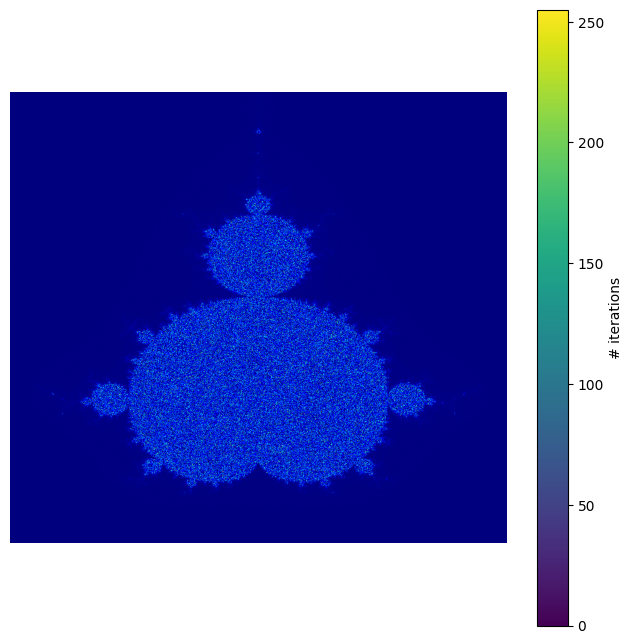

In [28]:
points_mc, counts_mc = mandelbrot_parallel_mc()
mandelbrot_statistics(points_mc, counts_mc, method='monte-carlo')
plot_mandelbrot_gradient(points_mc, counts_mc, method='monte-carlo')

Mandelbrot area: 1.51859125 using fixed method
Mean estimated area: 1.51859125e-06
Standard deviation of estimated area: 2.852052522899437e-06
95% Confidence interval for the estimated area: (1.5130013297731005e-06, 1.5241811702268994e-06)
Saved: media/mandelbrot_fixed_gradient_250_1000.png


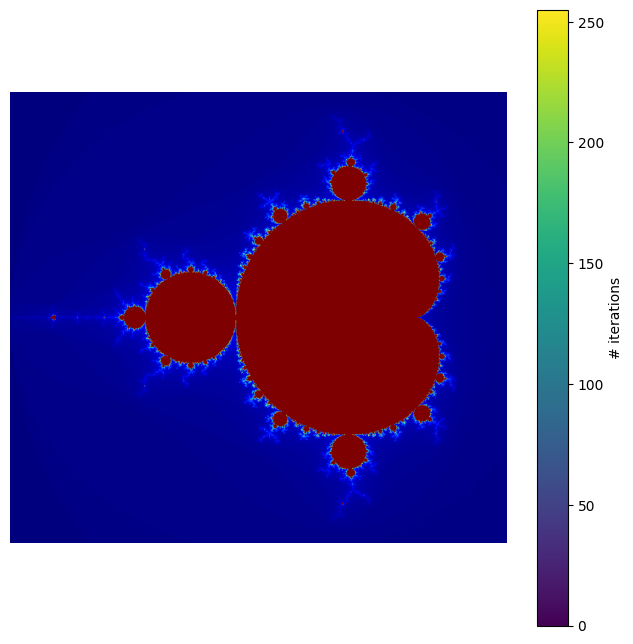

In [29]:
points_fixed, counts_fixed = mandelbrot_parallel_fixed()
mandelbrot_statistics(points_fixed, counts_fixed, method='fixed')
plot_mandelbrot_gradient(points_fixed, counts_fixed, method='fixed')

In [41]:
from scipy.stats import qmc

def latin_hypercube_sampling(max_iter, n_samples):
    sampler = qmc.LatinHypercube(d=2)
    sample = sampler.random(n=n_samples)
    range_real = X_LIM[1] - X_LIM[0]
    range_imag = Y_LIM[1] - Y_LIM[0]
    points = np.zeros((n_samples, 2))
    points[:, 0] = X_LIM[0] + sample[:, 0] * range_real
    points[:, 1] = Y_LIM[0] + sample[:, 1] * range_imag
    c_points = points[:, 0] + 1j * points[:, 1]
    counts = np.array([mandelbrot(c, max_iter) for c in c_points])
    return c_points, counts


In [42]:
@jit(nopython=True)
def stratified_sampling(max_iter, n_strata, samples_per_stratum):
    real_strata_edges = np.linspace(*X_LIM, n_strata + 1)
    imag_strata_edges = np.linspace(*Y_LIM, n_strata + 1)
    
    c_points = np.zeros(n_strata * n_strata * samples_per_stratum, dtype=np.complex128)
    counts = np.zeros(n_strata * n_strata * samples_per_stratum, dtype=np.int32)
    
    index = 0
    for i in prange(n_strata):
        for j in prange(n_strata):
            real_samples = np.random.uniform(real_strata_edges[i], real_strata_edges[i+1], samples_per_stratum)
            imag_samples = np.random.uniform(imag_strata_edges[j], imag_strata_edges[j+1], samples_per_stratum)
            
            for k in prange(samples_per_stratum):
                c = real_samples[k] + 1j * imag_samples[k]
                c_points[index] = c
                counts[index] = mandelbrot(c, max_iter)
                index += 1

    return c_points, counts

Mandelbrot area: 1.5497625000000002 using random method
Mean estimated area: 1.5497625e-05
Standard deviation of estimated area: 2.8727923542179057e-05
95% Confidence interval for the estimated area: (1.5319570757001323e-05, 1.5675679242998678e-05)
Saved: media/mandelbrot_random_gradient_250_316.png


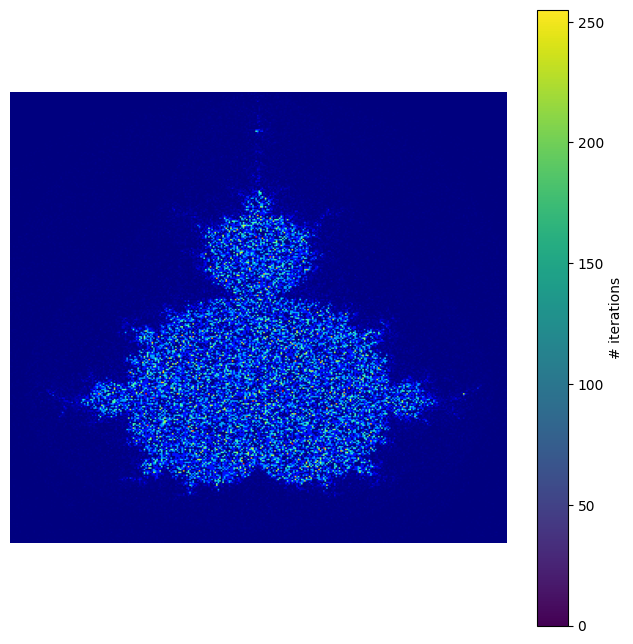

Mandelbrot area: 1.5499687500000001 using lhs method
Mean estimated area: 1.54996875e-05
Standard deviation of estimated area: 2.8729278736889847e-05
95% Confidence interval for the estimated area: (1.5321624857571824e-05, 1.5677750142428174e-05)
Saved: media/mandelbrot_lhs_gradient_250_316.png


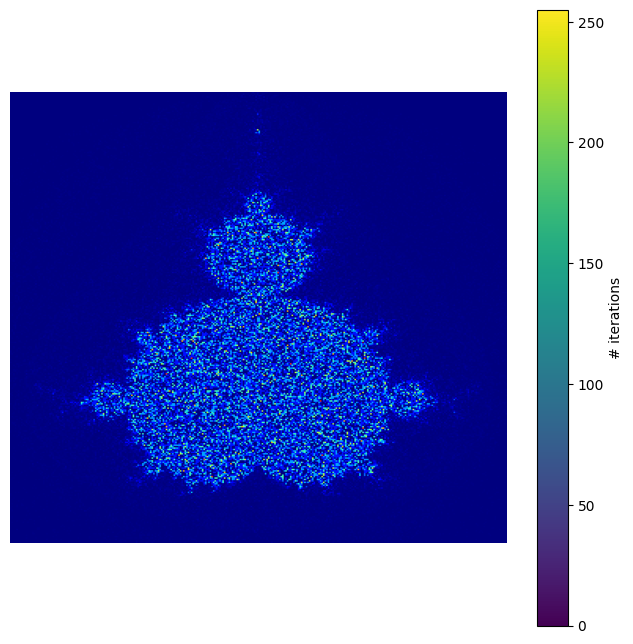

Mandelbrot area: 1.54185625 using orthogonal method
Mean estimated area: 1.5418562500000003e-05
Standard deviation of estimated area: 2.8675814292393635e-05
95% Confidence interval for the estimated area: (1.5240831227542865e-05, 1.559629377245714e-05)
Saved: media/mandelbrot_orthogonal_gradient_250_316.png


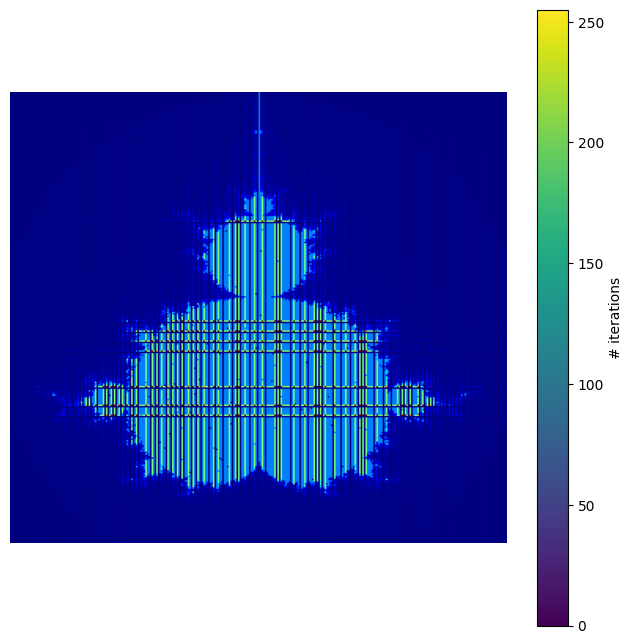

Mandelbrot area: 1.5454888185964395 using random method
Mean estimated area: 1.0335367331820452e-05
Standard deviation of estimated area: 1.9192790552277512e-05
95% Confidence interval for the estimated area: (1.0238088971976531e-05, 1.0432645691664373e-05)
Saved: media/mandelbrot_random_gradient_250_386.png


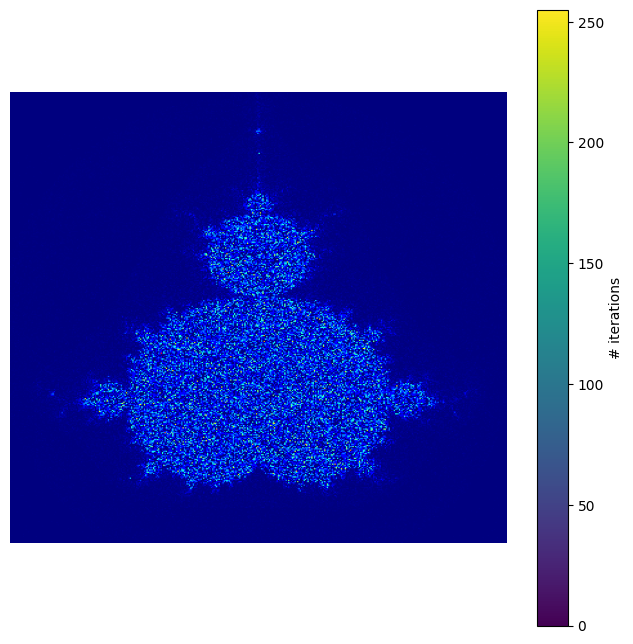

Mandelbrot area: 1.5439256289539502 using lhs method
Mean estimated area: 1.0324913591249818e-05
Standard deviation of estimated area: 1.9185894863657845e-05
95% Confidence interval for the estimated area: (1.0227670182096215e-05, 1.042215700040342e-05)
Saved: media/mandelbrot_lhs_gradient_250_386.png


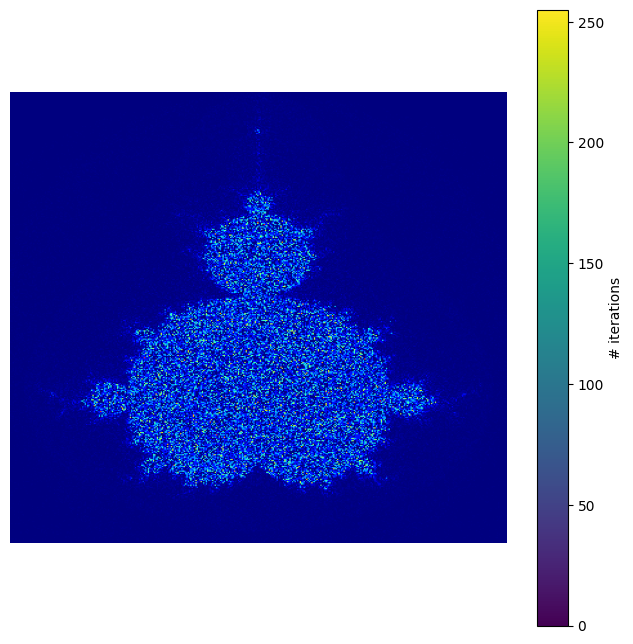

Mandelbrot area: 1.542776224805061 using orthogonal method
Mean estimated area: 1.0317227017300823e-05
Standard deviation of estimated area: 1.9180819287971252e-05
95% Confidence interval for the estimated area: (1.0220009333623498e-05, 1.0414444700978148e-05)
Saved: media/mandelbrot_orthogonal_gradient_250_386.png


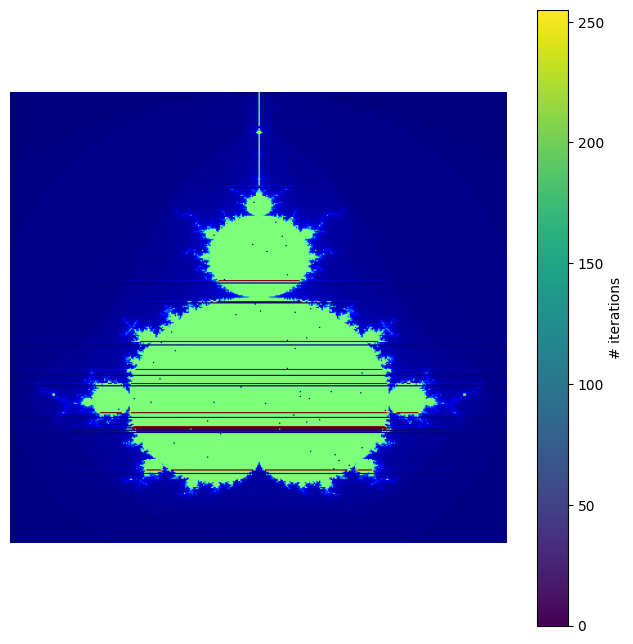

Mandelbrot area: 1.545203952487858 using random method
Mean estimated area: 6.9103868075447794e-06
Standard deviation of estimated area: 1.2834108861808361e-05
95% Confidence interval for the estimated area: (6.85719165196644e-06, 6.963581963123119e-06)
Saved: media/mandelbrot_random_gradient_250_472.png


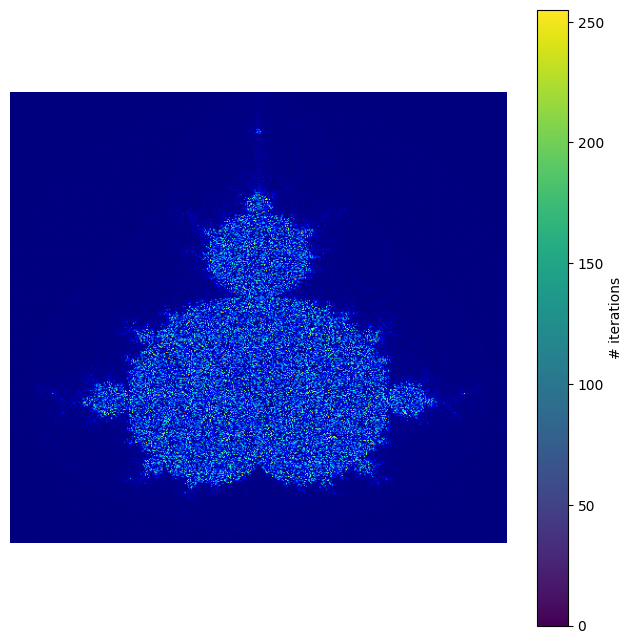

Mandelbrot area: 1.5429594912479987 using lhs method
Mean estimated area: 6.900349235923896e-06
Standard deviation of estimated area: 1.2827484560355554e-05
95% Confidence interval for the estimated area: (6.84718153692631e-06, 6.9535169349214814e-06)
Saved: media/mandelbrot_lhs_gradient_250_472.png


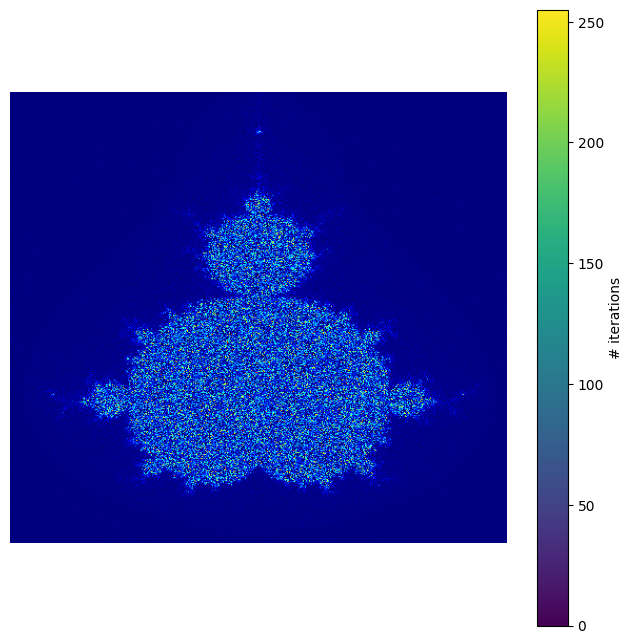

Mandelbrot area: 1.5435744121356314 using orthogonal method
Mean estimated area: 6.903099255546056e-06
Standard deviation of estimated area: 1.2829300558708486e-05
95% Confidence interval for the estimated area: (6.849924029550223e-06, 6.956274481541889e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_472.png


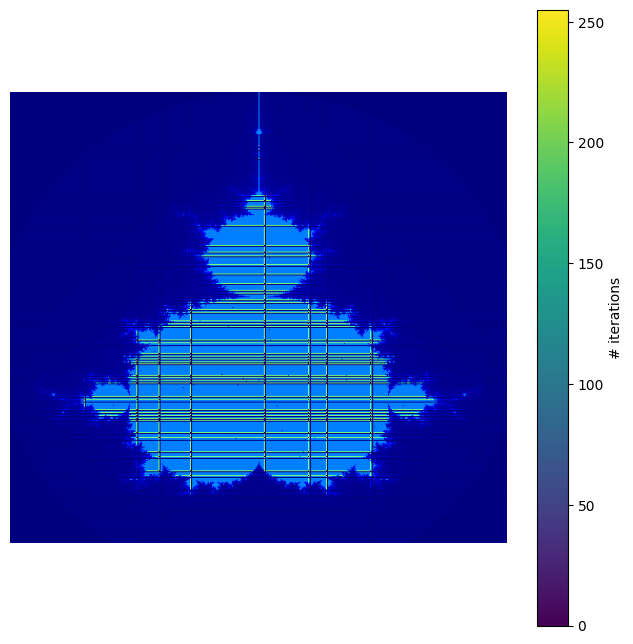

Mandelbrot area: 1.5519073182402727 using random method
Mean estimated area: 4.641287550438953e-06
Standard deviation of estimated area: 8.59583852791446e-06
95% Confidence interval for the estimated area: (4.612152036241167e-06, 4.670423064636738e-06)
Saved: media/mandelbrot_random_gradient_250_578.png


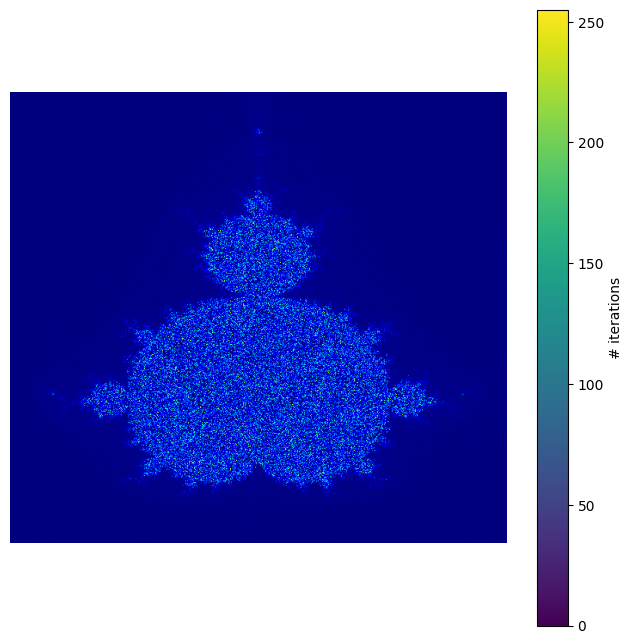

Mandelbrot area: 1.5451838532164968 using lhs method
Mean estimated area: 4.6211796908110685e-06
Standard deviation of estimated area: 8.582613174289504e-06
95% Confidence interval for the estimated area: (4.592089003825551e-06, 4.650270377796586e-06)
Saved: media/mandelbrot_lhs_gradient_250_578.png


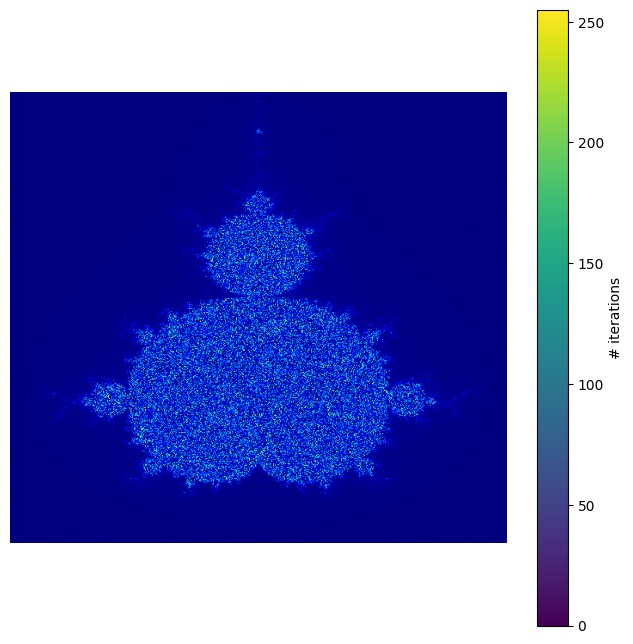

Mandelbrot area: 1.5427782097676226 using orthogonal method
Mean estimated area: 4.613985135531367e-06
Standard deviation of estimated area: 8.577864764146807e-06
95% Confidence interval for the estimated area: (4.584910543237563e-06, 4.643059727825171e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_578.png


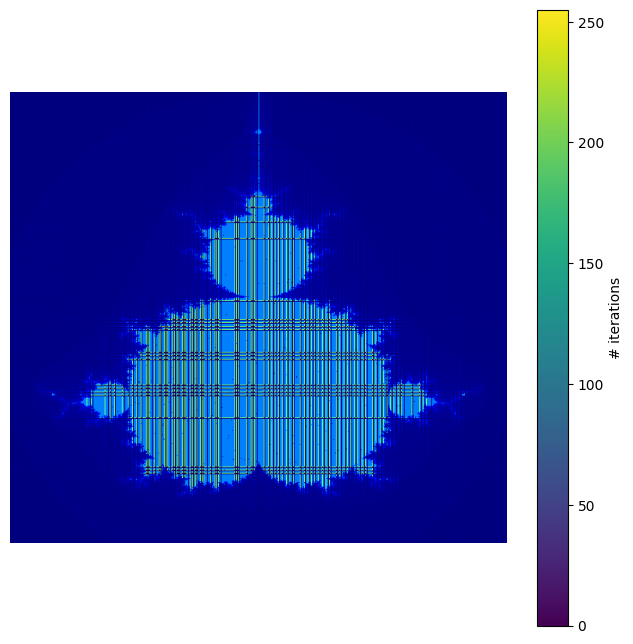

Mandelbrot area: 1.5451700000000002 using random method
Mean estimated area: 3.0903399999999997e-06
Standard deviation of estimated area: 5.739515621416073e-06
95% Confidence interval for the estimated area: (3.074431166700729e-06, 3.1062488332992703e-06)
Saved: media/mandelbrot_random_gradient_250_707.png


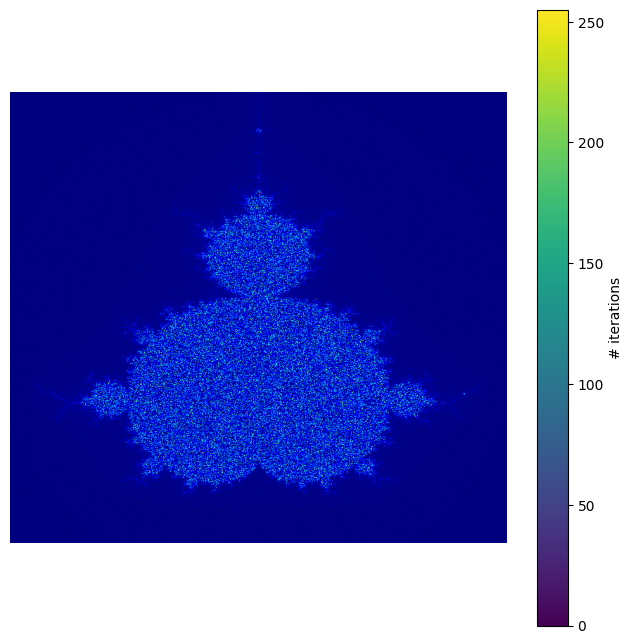

Mandelbrot area: 1.54589875 using lhs method
Mean estimated area: 3.0917975e-06
Standard deviation of estimated area: 5.7404764392978084e-06
95% Confidence interval for the estimated area: (3.0758860034983758e-06, 3.1077089965016243e-06)
Saved: media/mandelbrot_lhs_gradient_250_707.png


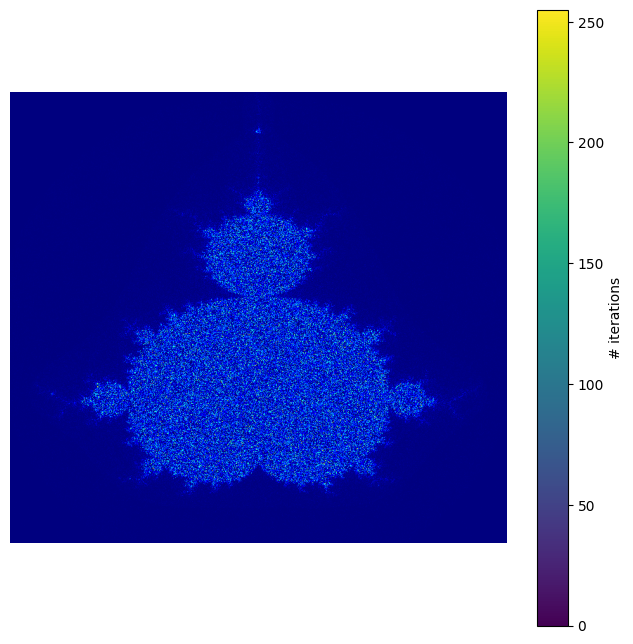

Mandelbrot area: 1.5417874999999999 using orthogonal method
Mean estimated area: 3.083574999999999e-06
Standard deviation of estimated area: 5.735049019053762e-06
95% Confidence interval for the estimated area: (3.06767854726332e-06, 3.099471452736678e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_707.png


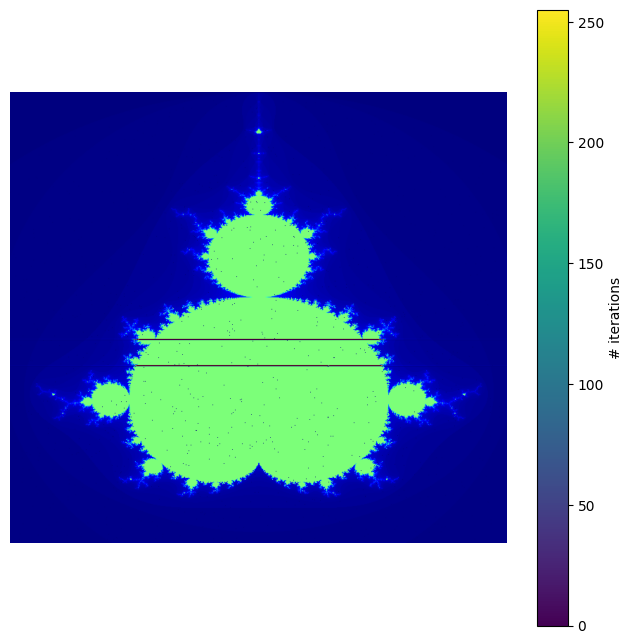

Mandelbrot area: 1.5360177284095926 using random method
Mean estimated area: 1.0272029962480723e-05
Standard deviation of estimated area: 1.9150885289401257e-05
95% Confidence interval for the estimated area: (1.0174963998808706e-05, 1.036909592615274e-05)
Saved: media/mandelbrot_random_gradient_250_386.png


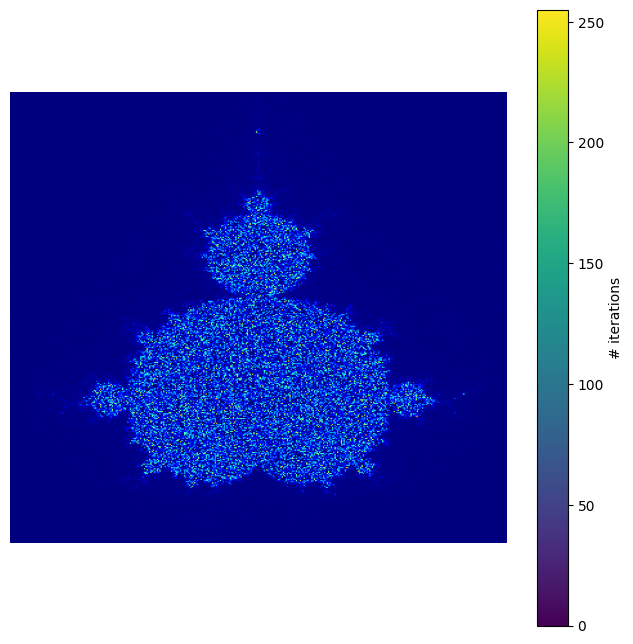

Mandelbrot area: 1.5307304693247021 using lhs method
Mean estimated area: 1.023667172231534e-05
Standard deviation of estimated area: 1.9127360419768756e-05
95% Confidence interval for the estimated area: (1.0139724994078481e-05, 1.03336184505522e-05)
Saved: media/mandelbrot_lhs_gradient_250_386.png


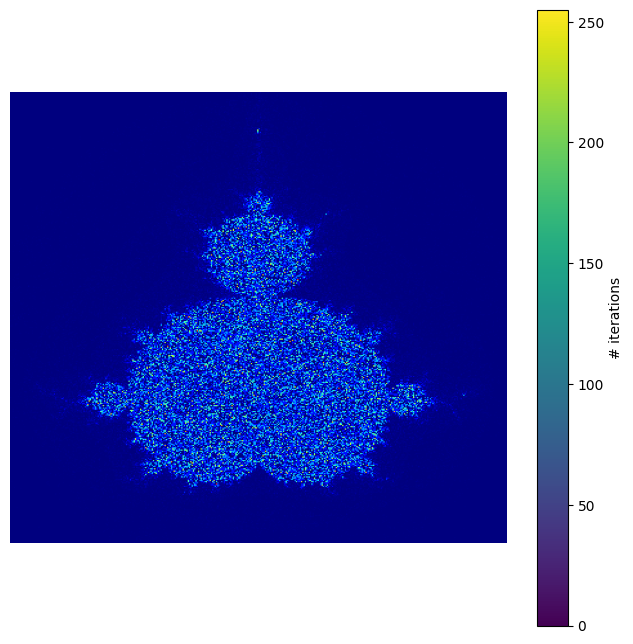

Mandelbrot area: 1.5296270413417683 using orthogonal method
Mean estimated area: 1.0229292611324304e-05
Standard deviation of estimated area: 1.912243898564444e-05
95% Confidence interval for the estimated area: (1.0132370827299615e-05, 1.0326214395348992e-05)
Saved: media/mandelbrot_orthogonal_gradient_250_386.png


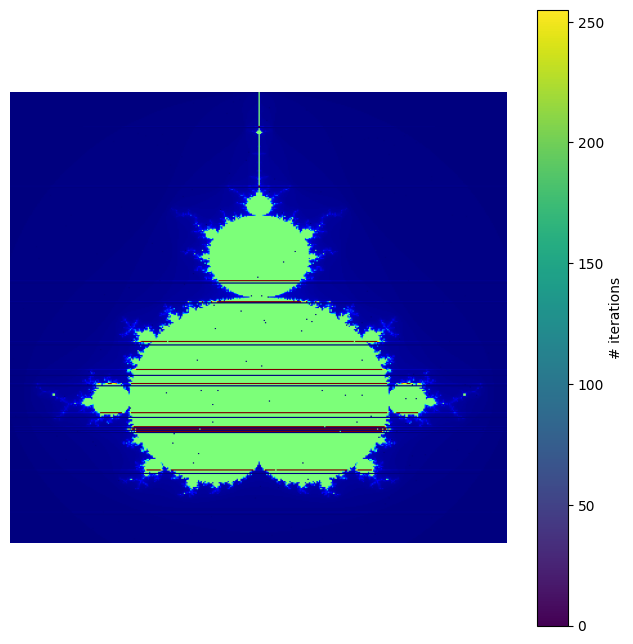

Mandelbrot area: 1.524819325062834 using random method
Mean estimated area: 6.819223657070176e-06
Standard deviation of estimated area: 1.2773530115573987e-05
95% Confidence interval for the estimated area: (6.766279589889587e-06, 6.872167724250765e-06)
Saved: media/mandelbrot_random_gradient_250_472.png


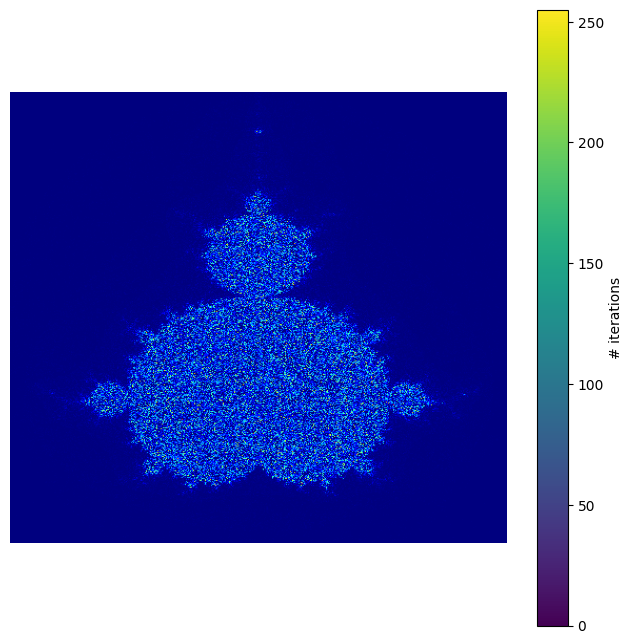

Mandelbrot area: 1.5402230932980332 using lhs method
Mean estimated area: 6.888111648605284e-06
Standard deviation of estimated area: 1.2819393094422875e-05
95% Confidence interval for the estimated area: (6.834977487330791e-06, 6.941245809879777e-06)
Saved: media/mandelbrot_lhs_gradient_250_472.png


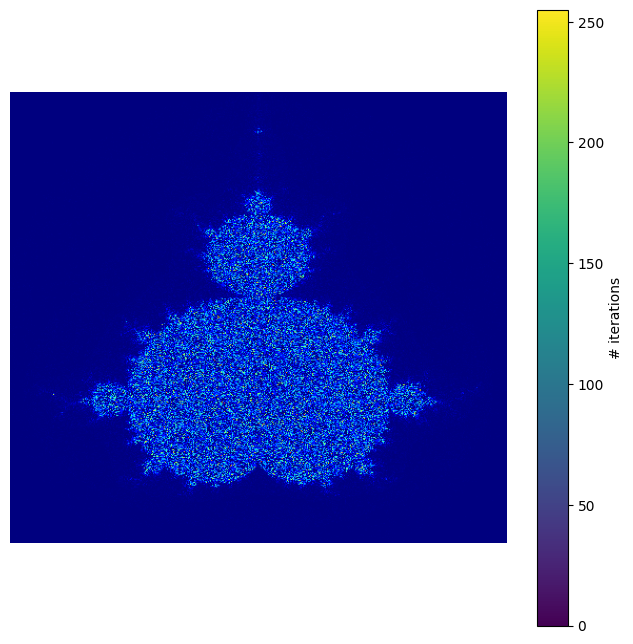

Mandelbrot area: 1.5298309302970403 using orthogonal method
Mean estimated area: 6.841636316990781e-06
Standard deviation of estimated area: 1.2788510380563762e-05
95% Confidence interval for the estimated area: (6.7886301592096435e-06, 6.894642474771919e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_472.png


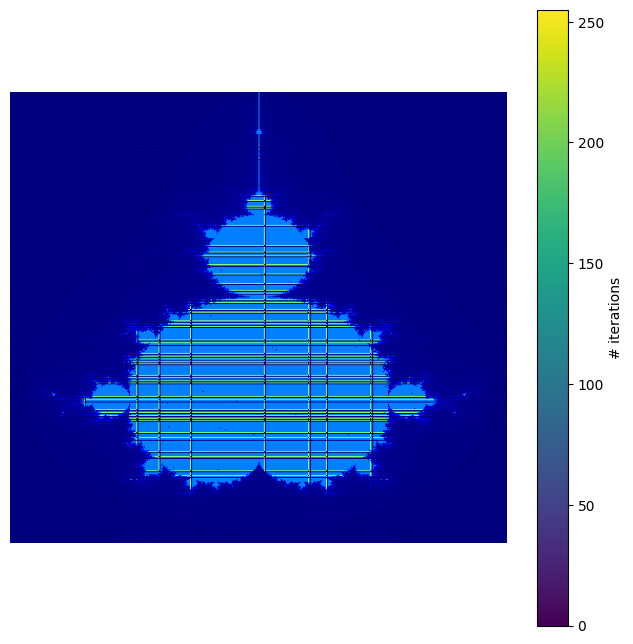

Mandelbrot area: 1.5246639202081527 using random method
Mean estimated area: 4.559810749194464e-06
Standard deviation of estimated area: 8.54183026557991e-06
95% Confidence interval for the estimated area: (4.530858295496121e-06, 4.588763202892808e-06)
Saved: media/mandelbrot_random_gradient_250_578.png


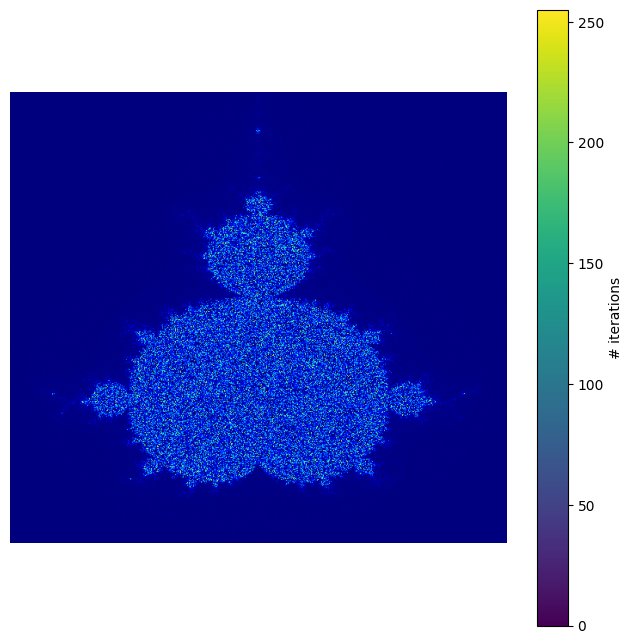

Mandelbrot area: 1.5291256691688848 using lhs method
Mean estimated area: 4.5731544970209184e-06
Standard deviation of estimated area: 8.55075191380475e-06
95% Confidence interval for the estimated area: (4.544171803479461e-06, 4.602137190562376e-06)
Saved: media/mandelbrot_lhs_gradient_250_578.png


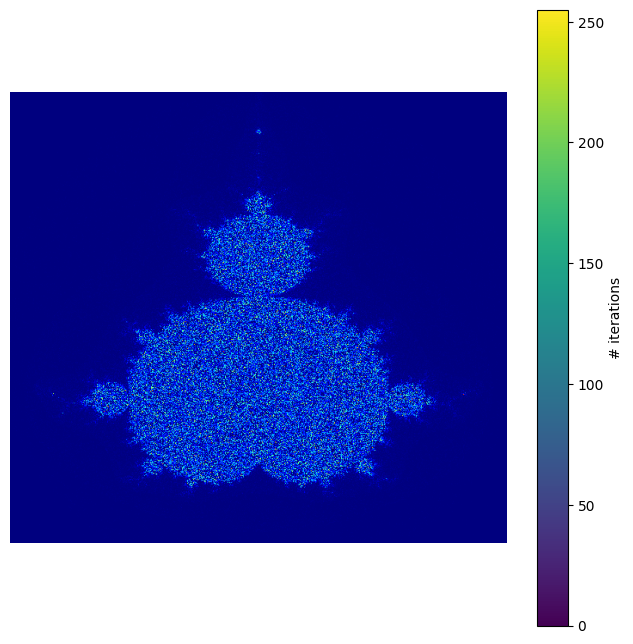

Mandelbrot area: 1.530092038759458 using orthogonal method
Mean estimated area: 4.576044617517895e-06
Standard deviation of estimated area: 8.552680283339242e-06
95% Confidence interval for the estimated area: (4.547055387785958e-06, 4.605033847249832e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_578.png


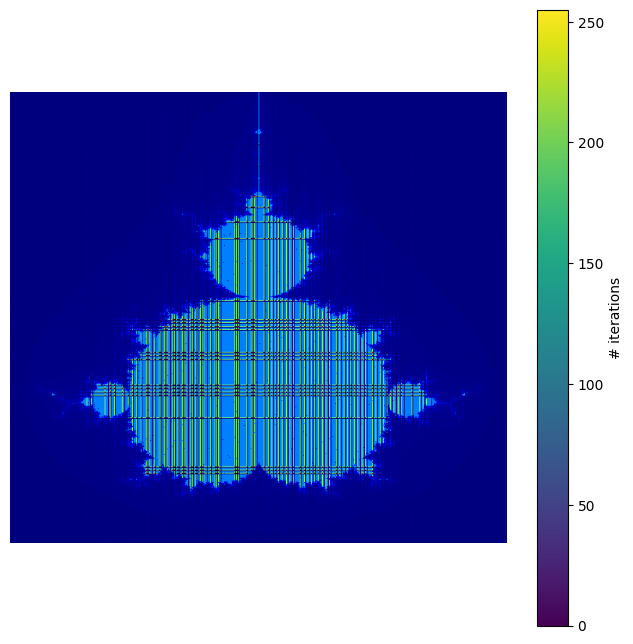

Mandelbrot area: 1.53322125 using random method
Mean estimated area: 3.066442499999999e-06
Standard deviation of estimated area: 5.723685900742138e-06
95% Confidence interval for the estimated area: (3.0505775436415695e-06, 3.082307456358429e-06)
Saved: media/mandelbrot_random_gradient_250_707.png


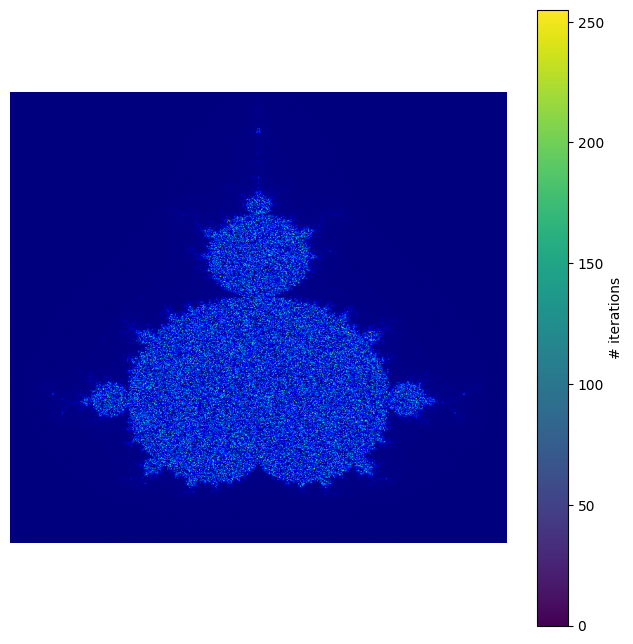

Mandelbrot area: 1.5344175 using lhs method
Mean estimated area: 3.068835e-06
Standard deviation of estimated area: 5.725277159262432e-06
95% Confidence interval for the estimated area: (3.0529656329790325e-06, 3.0847043670209676e-06)
Saved: media/mandelbrot_lhs_gradient_250_707.png


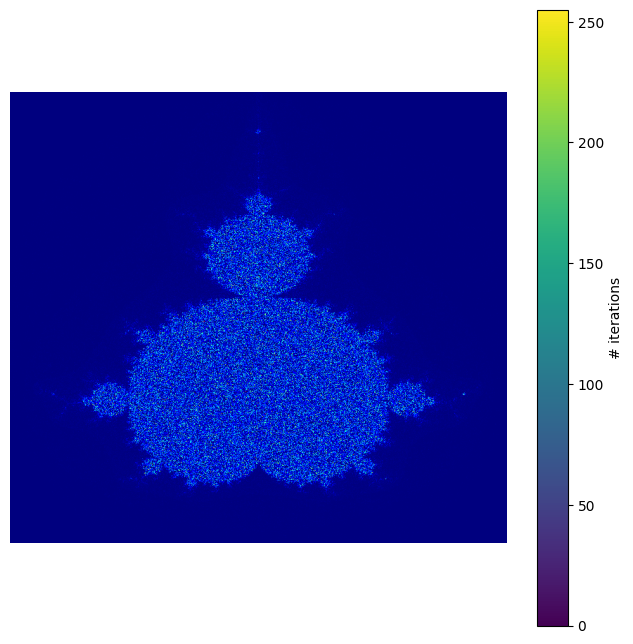

Mandelbrot area: 1.52876625 using orthogonal method
Mean estimated area: 3.057532499999999e-06
Standard deviation of estimated area: 5.717747132543402e-06
95% Confidence interval for the estimated area: (3.041684004764686e-06, 3.0733809952353115e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_707.png


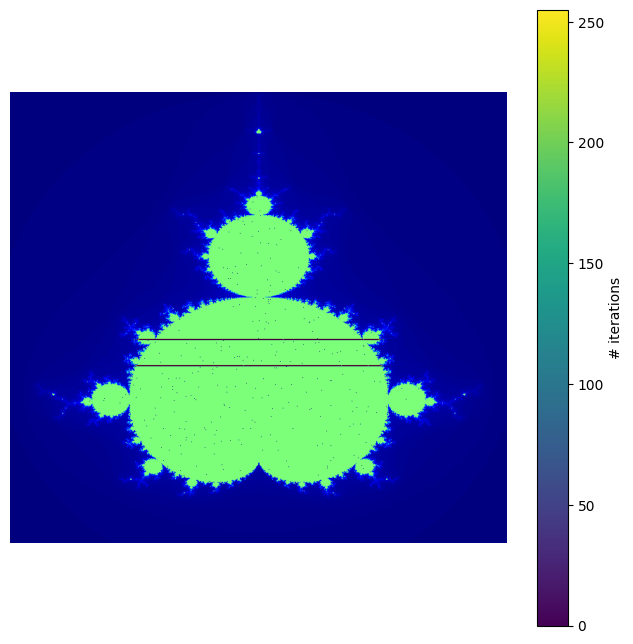

Mandelbrot area: 1.528662580610538 using random method
Mean estimated area: 6.836411279708676e-06
Standard deviation of estimated area: 1.2785023130030804e-05
95% Confidence interval for the estimated area: (6.783419575976249e-06, 6.889402983441103e-06)
Saved: media/mandelbrot_random_gradient_250_472.png


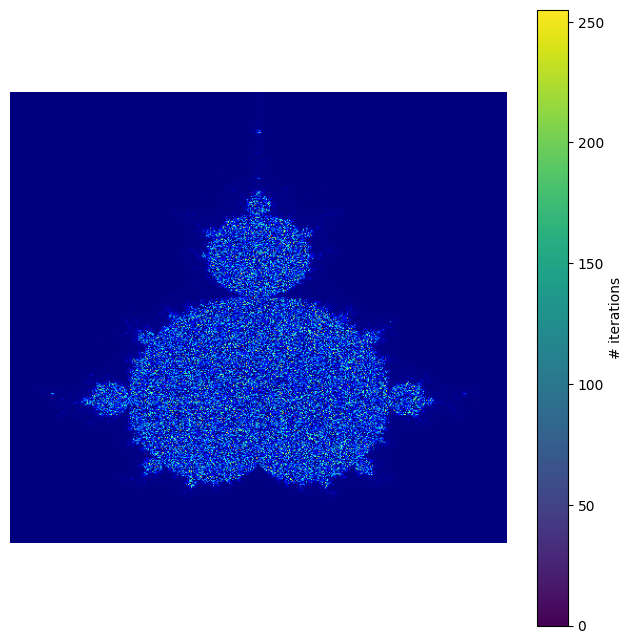

Mandelbrot area: 1.528662580610538 using lhs method
Mean estimated area: 6.836411279708677e-06
Standard deviation of estimated area: 1.2785023130030803e-05
95% Confidence interval for the estimated area: (6.78341957597625e-06, 6.889402983441104e-06)
Saved: media/mandelbrot_lhs_gradient_250_472.png


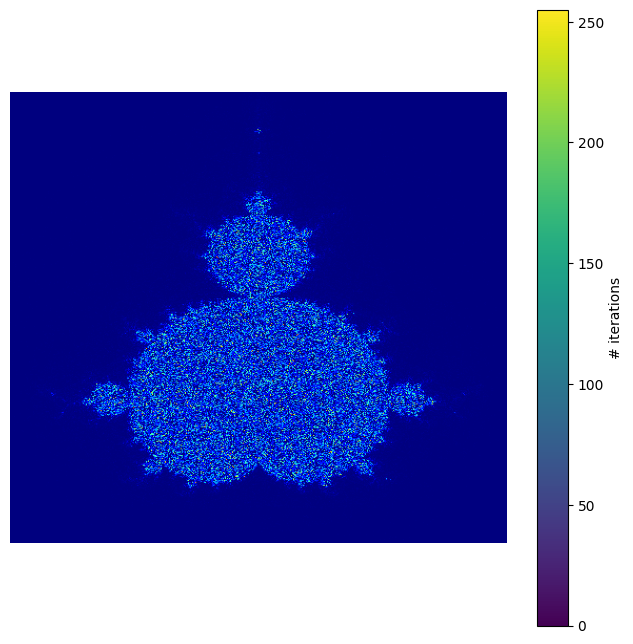

Mandelbrot area: 1.5211912918258006 using orthogonal method
Mean estimated area: 6.8029985412994325e-06
Standard deviation of estimated area: 1.2762649974577542e-05
95% Confidence interval for the estimated area: (6.750099570416472e-06, 6.8558975121823935e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_472.png


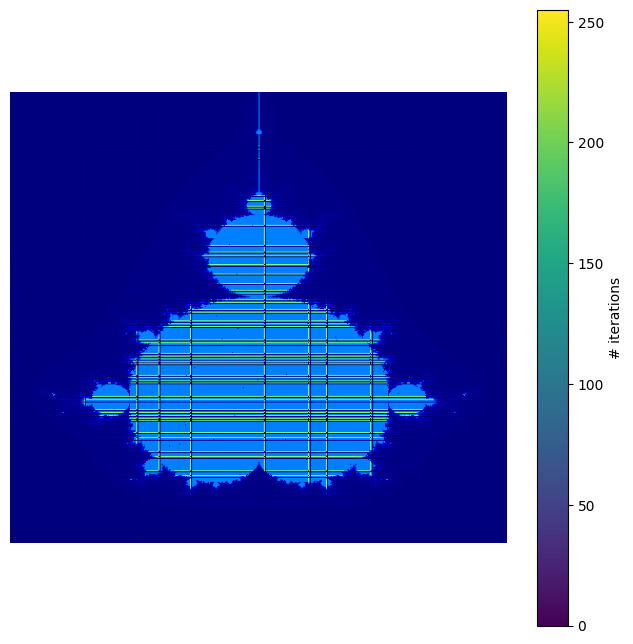

Mandelbrot area: 1.5250751413105244 using random method
Mean estimated area: 4.561040587703813e-06
Standard deviation of estimated area: 8.542653799096658e-06
95% Confidence interval for the estimated area: (4.5320853426463265e-06, 4.5899958327613e-06)
Saved: media/mandelbrot_random_gradient_250_578.png


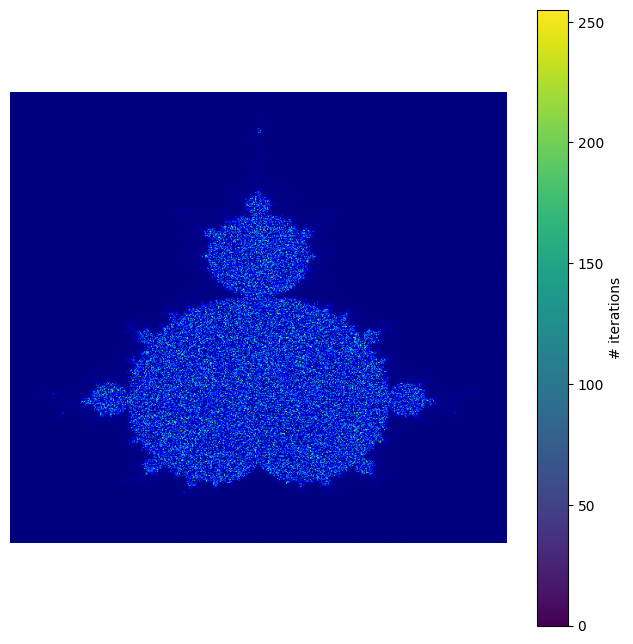

Mandelbrot area: 1.5180021383497324 using lhs method
Mean estimated area: 4.5398873653429824e-06
Standard deviation of estimated area: 8.528453235376349e-06
95% Confidence interval for the estimated area: (4.5109802529632506e-06, 4.568794477722714e-06)
Saved: media/mandelbrot_lhs_gradient_250_578.png


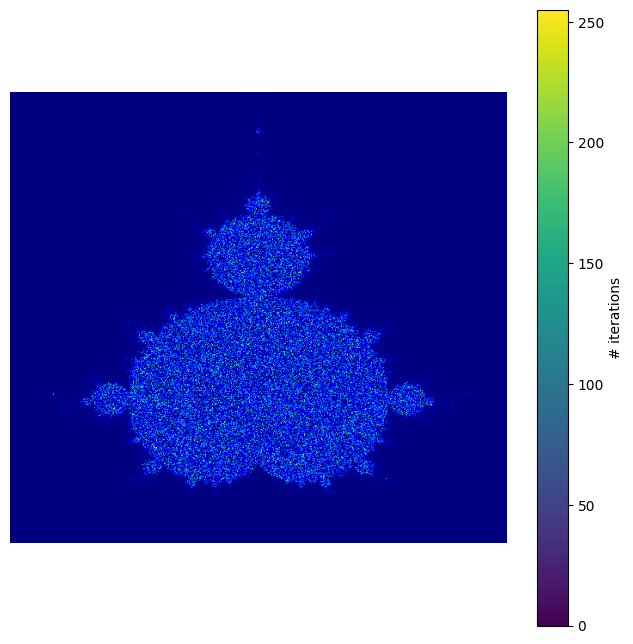

Mandelbrot area: 1.5221143493734486 using orthogonal method
Mean estimated area: 4.552185750436489e-06
Standard deviation of estimated area: 8.536718629962072e-06
95% Confidence interval for the estimated area: (4.523250622579207e-06, 4.581120878293771e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_578.png


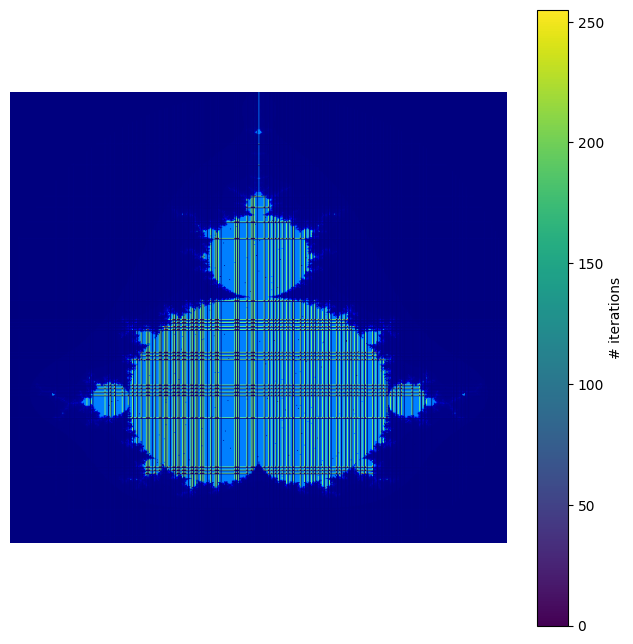

Mandelbrot area: 1.5300725 using random method
Mean estimated area: 3.0601449999999995e-06
Standard deviation of estimated area: 5.719490515257325e-06
95% Confidence interval for the estimated area: (3.0442916724431457e-06, 3.0759983275568533e-06)
Saved: media/mandelbrot_random_gradient_250_707.png


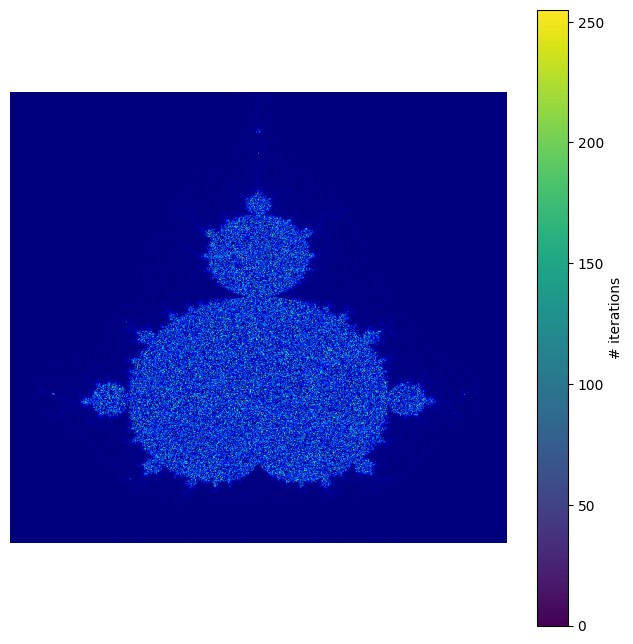

Mandelbrot area: 1.5244075000000001 using lhs method
Mean estimated area: 3.048815e-06
Standard deviation of estimated area: 5.711917243603254e-06
95% Confidence interval for the estimated area: (3.032982664095443e-06, 3.064647335904557e-06)
Saved: media/mandelbrot_lhs_gradient_250_707.png


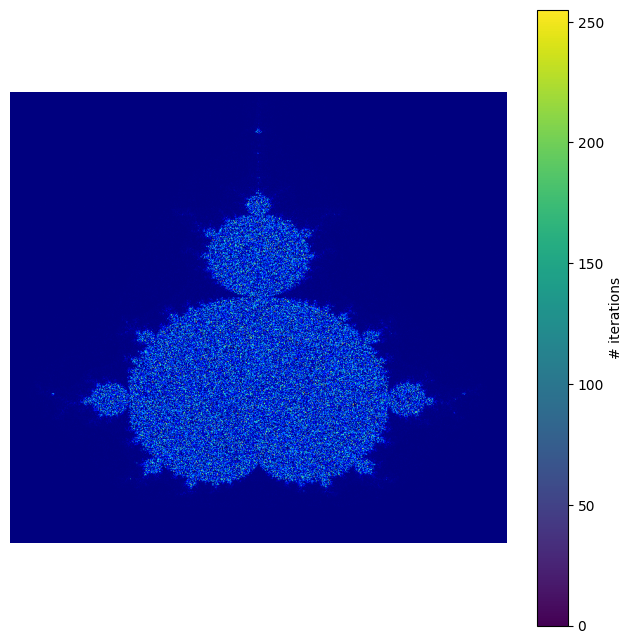

Mandelbrot area: 1.52024125 using orthogonal method
Mean estimated area: 3.0404825000000004e-06
Standard deviation of estimated area: 5.706326810350517e-06
95% Confidence interval for the estimated area: (3.0246656597010926e-06, 3.056299340298908e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_707.png


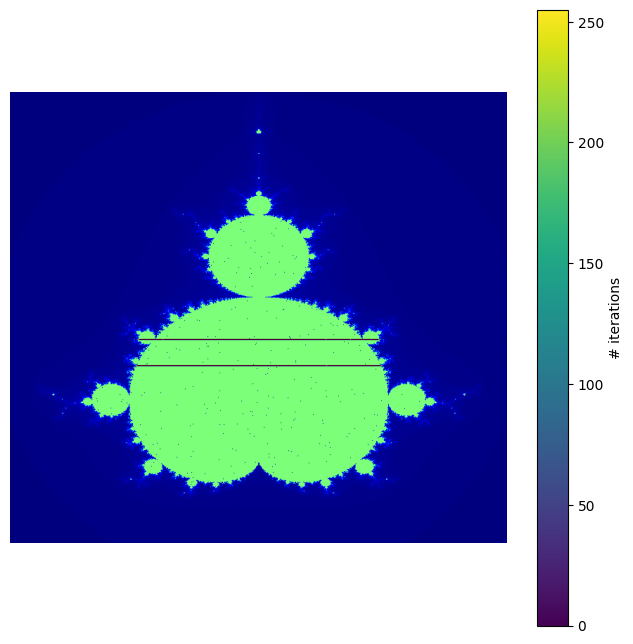

Mandelbrot area: 1.5225050094207018 using random method
Mean estimated area: 4.553354097020372e-06
Standard deviation of estimated area: 8.537502504790428e-06
95% Confidence interval for the estimated area: (4.524416312226699e-06, 4.582291881814045e-06)
Saved: media/mandelbrot_random_gradient_250_578.png


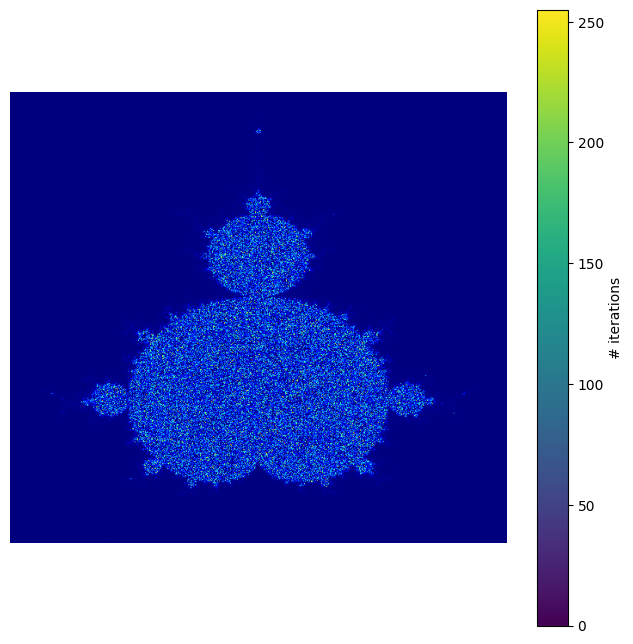

Mandelbrot area: 1.5219704219876184 using lhs method
Mean estimated area: 4.551755306958217e-06
Standard deviation of estimated area: 8.536429775518856e-06
95% Confidence interval for the estimated area: (4.522821158170365e-06, 4.580689455746069e-06)
Saved: media/mandelbrot_lhs_gradient_250_578.png


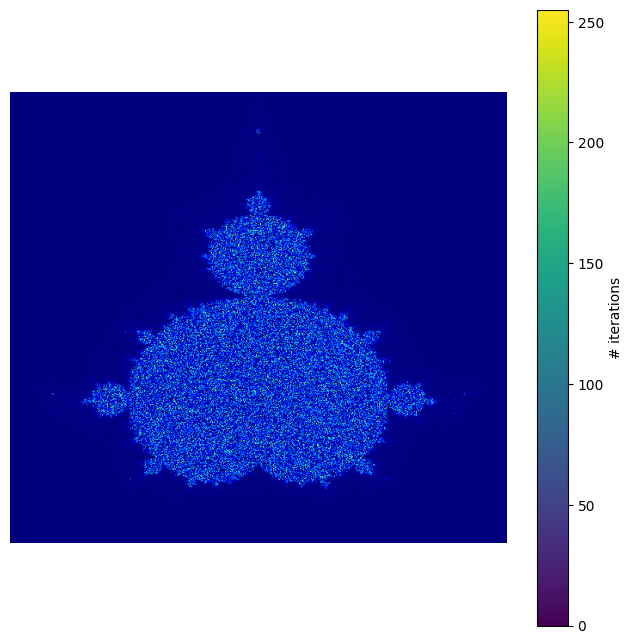

Mandelbrot area: 1.5154936896252653 using orthogonal method
Mean estimated area: 4.5323853504359395e-06
Standard deviation of estimated area: 8.523398694968199e-06
95% Confidence interval for the estimated area: (4.503495370373589e-06, 4.56127533049829e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_578.png


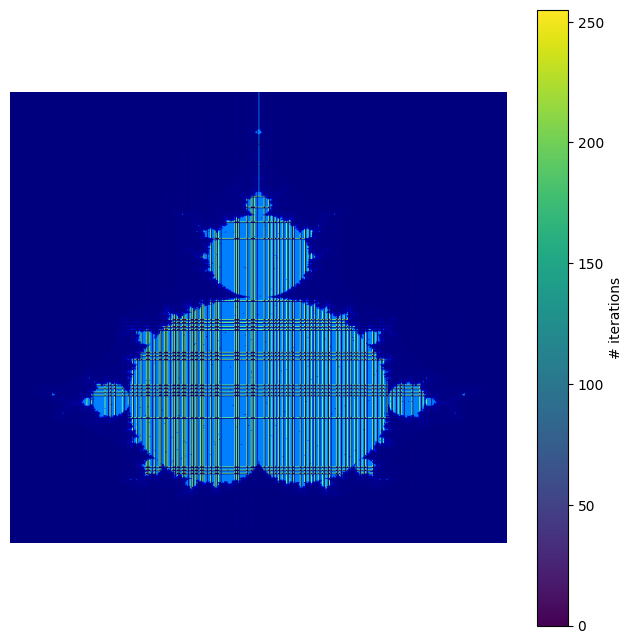

Mandelbrot area: 1.5200075000000002 using random method
Mean estimated area: 3.040015e-06
Standard deviation of estimated area: 5.706012632910598e-06
95% Confidence interval for the estimated area: (3.0241990305405233e-06, 3.0558309694594764e-06)
Saved: media/mandelbrot_random_gradient_250_707.png


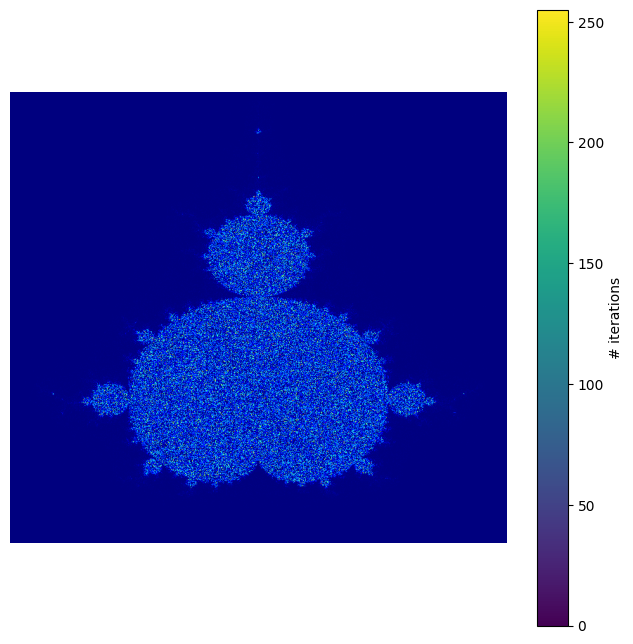

Mandelbrot area: 1.51630875 using lhs method
Mean estimated area: 3.0326175e-06
Standard deviation of estimated area: 5.70103382968977e-06
95% Confidence interval for the estimated area: (3.016815330825372e-06, 3.0484196691746277e-06)
Saved: media/mandelbrot_lhs_gradient_250_707.png


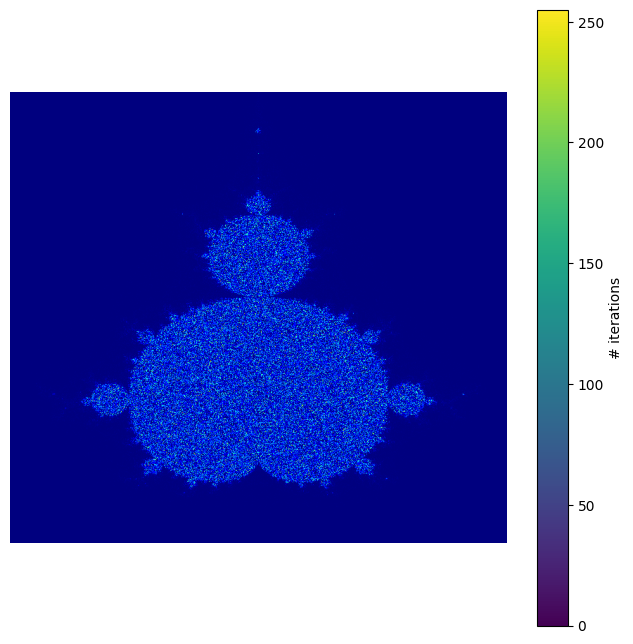

Mandelbrot area: 1.5143425 using orthogonal method
Mean estimated area: 3.028685e-06
Standard deviation of estimated area: 5.698381424920301e-06
95% Confidence interval for the estimated area: (3.0128901827811996e-06, 3.0444798172188007e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_707.png


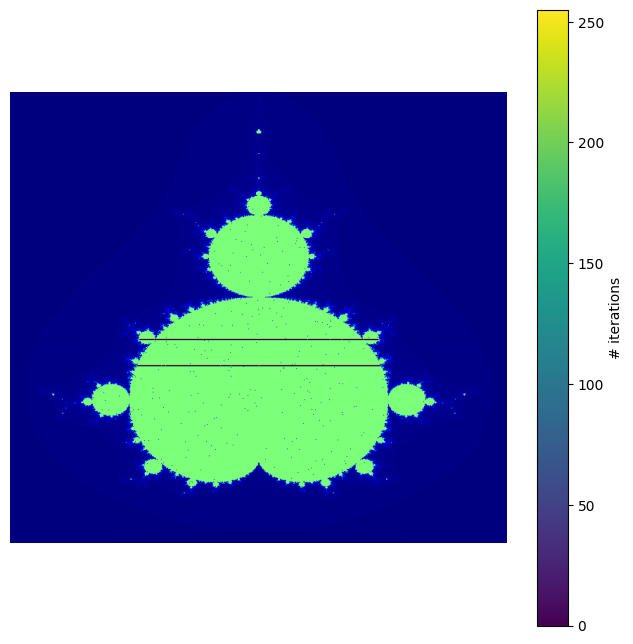

Mandelbrot area: 1.5178075 using random method
Mean estimated area: 3.035615000000001e-06
Standard deviation of estimated area: 5.703052943064858e-06
95% Confidence interval for the estimated area: (3.0198072342314764e-06, 3.0514227657685253e-06)
Saved: media/mandelbrot_random_gradient_250_707.png


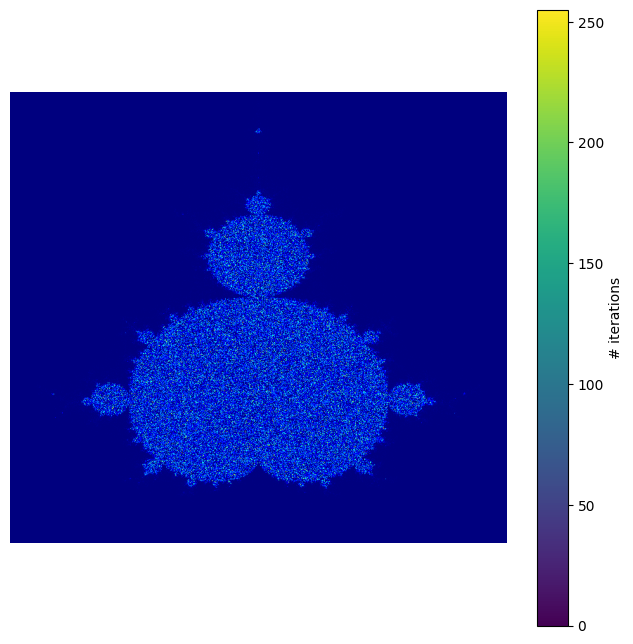

Mandelbrot area: 1.5113725 using lhs method
Mean estimated area: 3.0227450000000018e-06
Standard deviation of estimated area: 5.6943675036493325e-06
95% Confidence interval for the estimated area: (3.0069613085988815e-06, 3.038528691401122e-06)
Saved: media/mandelbrot_lhs_gradient_250_707.png


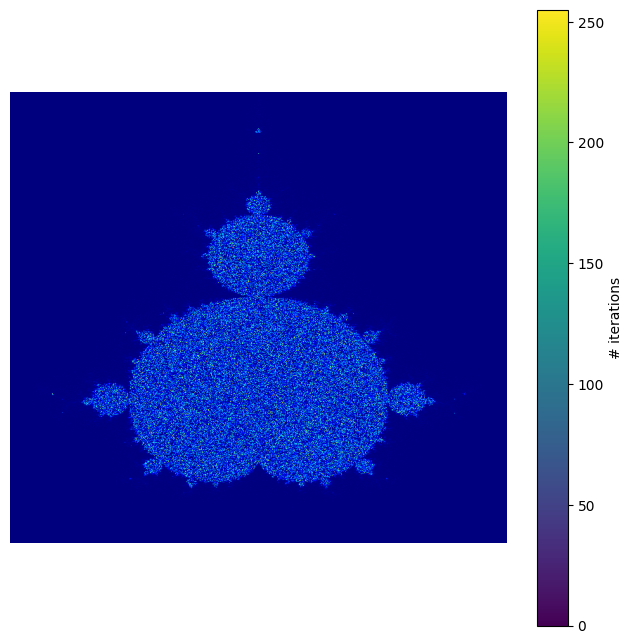

Mandelbrot area: 1.51075375 using orthogonal method
Mean estimated area: 3.0215075000000007e-06
Standard deviation of estimated area: 5.693530133846183e-06
95% Confidence interval for the estimated area: (3.0057261296269057e-06, 3.0372888703730958e-06)
Saved: media/mandelbrot_orthogonal_gradient_250_707.png


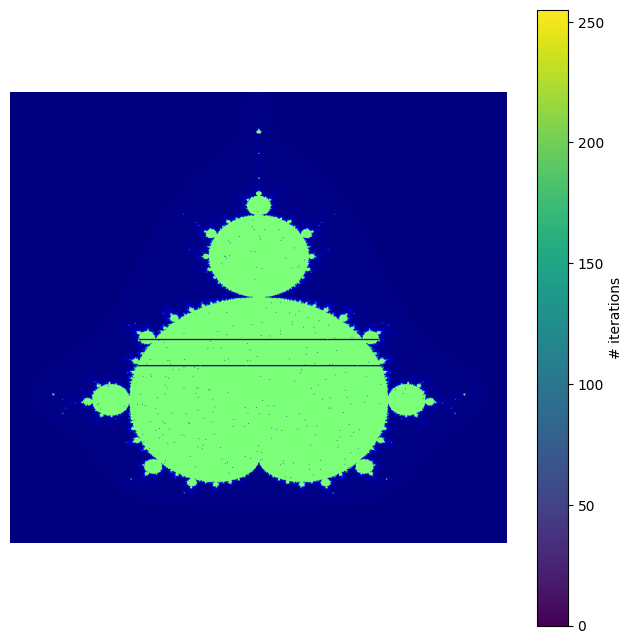

In [43]:
def investigate_convergence(iter_range, sample_sizes, method='monte-carlo', improvement_method=None):
    estimated_areas = []
    iteration_counts = []

    for max_iter in iter_range:
        for n_points in sample_sizes:
            if method == 'monte-carlo':
                if improvement_method == 'lhs':
                    c_points, counts = latin_hypercube_sampling(max_iter, n_points)
                elif improvement_method == 'stratified':
                    n_strata = int(np.sqrt(n_points))  # Assuming square root of n_points as number of strata for simplicity
                    c_points, counts = stratified_sampling(max_iter, n_strata, n_strata)
                else:
                    c_points, counts = mandelbrot_parallel_mc(max_iter, n_points)
            else:
                print("Other methods not implemented")
                return

            total_area = abs(X_LIM[0] - X_LIM[1]) * abs(Y_LIM[0] - Y_LIM[1])
            mandelbrot_ratio = np.count_nonzero(counts == max_iter) / len(counts)
            estimated_area = total_area * mandelbrot_ratio
            estimated_areas.append(estimated_area)
            iteration_counts.append(max_iter)
            
            print(f'Iterations: {max_iter}, Samples: {n_points}, Estimated area: {estimated_area}')

    plt.figure(figsize=(10, 6))
    plt.plot(iteration_counts, estimated_areas, marker='o')
    plt.xlabel('Iteration count')
    plt.ylabel('Estimated area')
    plt.title('Convergence of Monte Carlo Estimates of Mandelbrot Set Area')
    plt.grid(True)
    plt.show()

# Example usage:
iter_range = np.geomspace(100, 500, num=5).astype(int)  # Geometric progression for iterations
sample_sizes = np.geomspace(100000, 500000, num=5).astype(int)  # Geometric progression for sample sizes

for i, max_iter in enumerate(iter_range):
    for j, n_samples in enumerate(sample_sizes):
        if j >= i:  # Ensure that s increases as i increases
            for sampling_method in ['random', 'lhs', 'orthogonal']:
                run_simulation(max_iter, n_samples, sampling_method)

Iterations: 100, Samples: 100000, Estimated area: 1.5543
Iterations: 100, Samples: 149534, Estimated area: 1.5411670589966162
Iterations: 100, Samples: 223606, Estimated area: 1.5452654445766214
Iterations: 100, Samples: 334370, Estimated area: 1.545553952208631
Iterations: 100, Samples: 500000, Estimated area: 1.54429
Iterations: 149, Samples: 100000, Estimated area: 1.53456875
Iterations: 149, Samples: 149534, Estimated area: 1.5256730910695895
Iterations: 149, Samples: 223606, Estimated area: 1.530261374918383
Iterations: 149, Samples: 334370, Estimated area: 1.5306677483027784
Iterations: 149, Samples: 500000, Estimated area: 1.5408112500000002
Iterations: 223, Samples: 100000, Estimated area: 1.523225
Iterations: 223, Samples: 149534, Estimated area: 1.530822421656613
Iterations: 223, Samples: 223606, Estimated area: 1.5130435900646673
Iterations: 223, Samples: 334370, Estimated area: 1.5273162963184497
Iterations: 223, Samples: 500000, Estimated area: 1.5232525000000001
Iteration

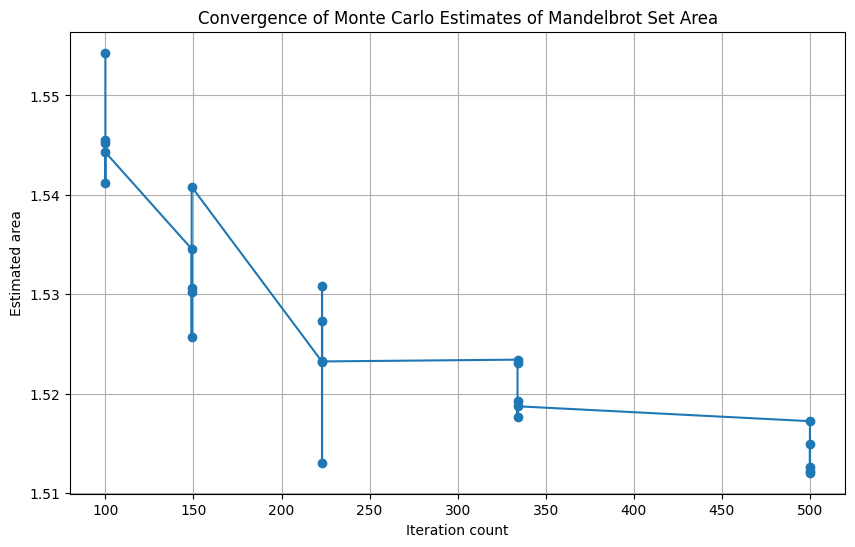

In [33]:
investigate_convergence(iter_range, sample_sizes)

Iterations: 100, Samples: 100000, Estimated area: 1.548525
Iterations: 100, Samples: 149534, Estimated area: 1.5428222009710166
Iterations: 100, Samples: 223606, Estimated area: 1.5524292729175424
Iterations: 100, Samples: 334370, Estimated area: 1.549830651673296
Iterations: 100, Samples: 500000, Estimated area: 1.54451
Iterations: 149, Samples: 100000, Estimated area: 1.5336062499999998
Iterations: 149, Samples: 149534, Estimated area: 1.5305005884949243
Iterations: 149, Samples: 223606, Estimated area: 1.536256853572802
Iterations: 149, Samples: 334370, Estimated area: 1.5367949427281156
Iterations: 149, Samples: 500000, Estimated area: 1.5398212500000001
Iterations: 223, Samples: 100000, Estimated area: 1.5250124999999999
Iterations: 223, Samples: 149534, Estimated area: 1.518270928350743
Iterations: 223, Samples: 223606, Estimated area: 1.531552708782412
Iterations: 223, Samples: 334370, Estimated area: 1.5203460986332507
Iterations: 223, Samples: 500000, Estimated area: 1.5236375

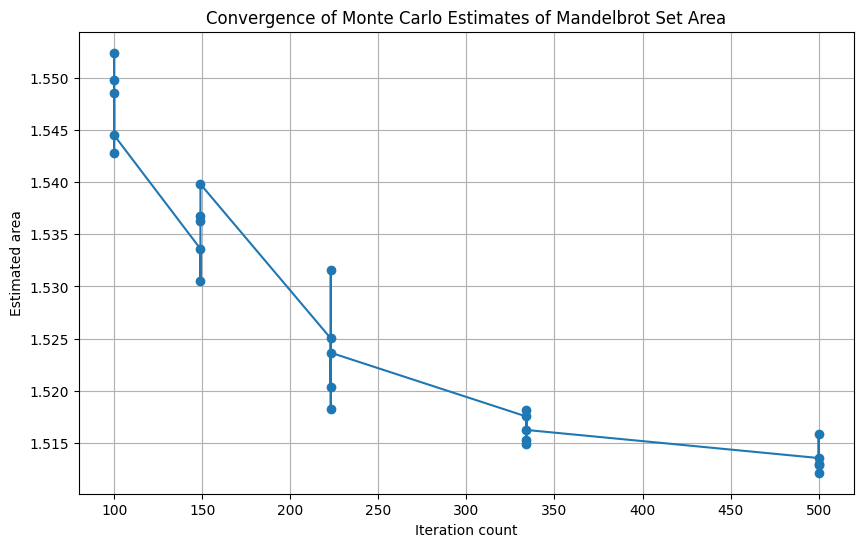

In [34]:
investigate_convergence(iter_range, sample_sizes, improvement_method='lhs')

Iterations: 100, Samples: 100000, Estimated area: 1.5465746347208333
Iterations: 100, Samples: 149534, Estimated area: 1.5464510418403972
Iterations: 100, Samples: 223606, Estimated area: 1.546566810485508
Iterations: 100, Samples: 334370, Estimated area: 1.5465330240226345
Iterations: 100, Samples: 500000, Estimated area: 1.5464869524259692
Iterations: 149, Samples: 100000, Estimated area: 1.5330719234114847
Iterations: 149, Samples: 149534, Estimated area: 1.5331396210935593
Iterations: 149, Samples: 223606, Estimated area: 1.5330974942590891
Iterations: 149, Samples: 334370, Estimated area: 1.533072624256403
Iterations: 149, Samples: 500000, Estimated area: 1.5331019819470628
Iterations: 223, Samples: 100000, Estimated area: 1.524156613054444
Iterations: 223, Samples: 149534, Estimated area: 1.5240804531108878
Iterations: 223, Samples: 223606, Estimated area: 1.5241215024361212
Iterations: 223, Samples: 334370, Estimated area: 1.5241100139371946
Iterations: 223, Samples: 500000, Est

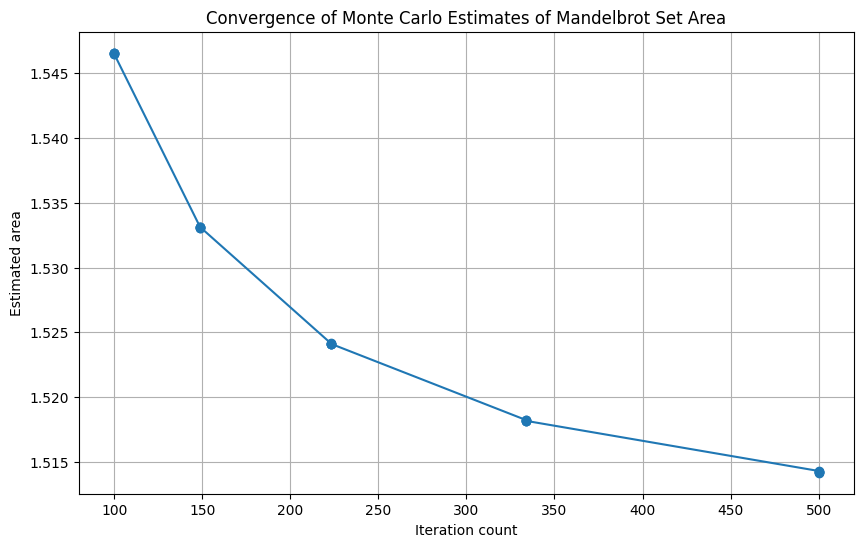

In [44]:
investigate_convergence(iter_range, sample_sizes, improvement_method='stratified')

Mandelbrot area: 1.5420625 using random method
Mean estimated area: 1.5420625e-05
Standard deviation of estimated area: 2.8677177635962482e-05
95% Confidence interval for the estimated area: (1.524288527760715e-05, 1.559836472239285e-05)
Saved: media/mandelbrot_random_gradient_250_316.png


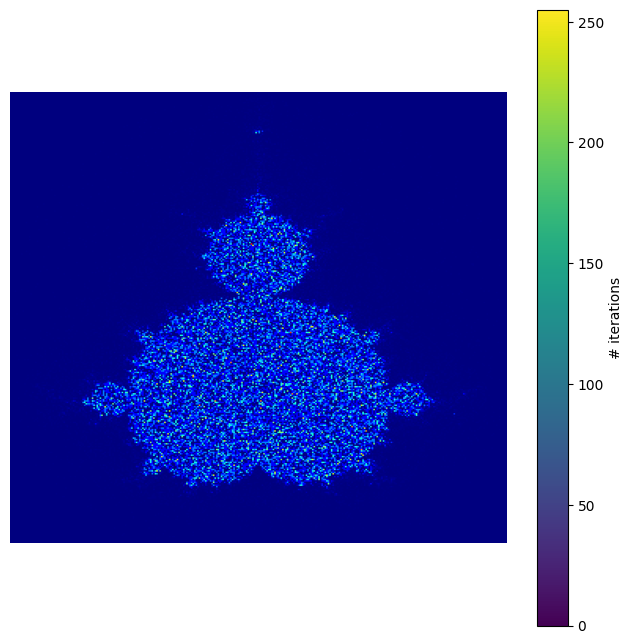

Mandelbrot area: 1.5272125 using lhs method
Mean estimated area: 1.5272125e-05
Standard deviation of estimated area: 2.8578470200904132e-05
95% Confidence interval for the estimated area: (1.5094997061386157e-05, 1.5449252938613845e-05)
Saved: media/mandelbrot_lhs_gradient_250_316.png


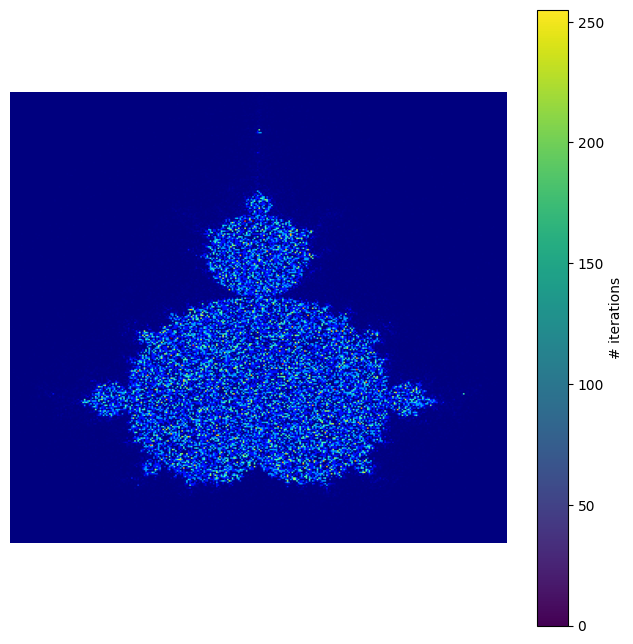

Mandelbrot area: 1.51710625 using orthogonal method
Mean estimated area: 1.5171062500000004e-05
Standard deviation of estimated area: 2.8510656570333038e-05
95% Confidence interval for the estimated area: (1.4994354866899665e-05, 1.5347770133100342e-05)
Saved: media/mandelbrot_orthogonal_gradient_250_316.png


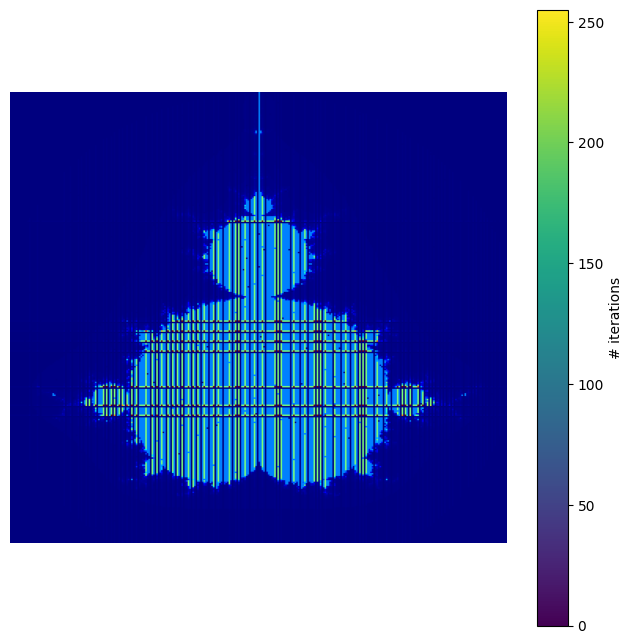

In [35]:
from scipy.stats import qmc
from pyDOE import lhs


def orthogonal_sampling(max_iter, n_samples, d=2):
    # Using Latin Hypercube Sampling as a basis for orthogonal sampling
    # This is not true orthogonal sampling but an attempt to ensure that
    # samples are evenly distributed across the entire space.
    intervals = np.linspace(0, 1, int(np.sqrt(n_samples)) + 1)
    points = np.array(np.meshgrid(*([intervals]*d))).T.reshape(-1, d)
    np.random.shuffle(points)
    points = points[:n_samples]
    
    range_real = X_LIM[1] - X_LIM[0]
    range_imag = Y_LIM[1] - Y_LIM[0]
    sampled_points = np.zeros((n_samples, 2))
    sampled_points[:, 0] = X_LIM[0] + points[:, 0] * range_real
    sampled_points[:, 1] = Y_LIM[0] + points[:, 1] * range_imag
    c_points = sampled_points[:, 0] + 1j * sampled_points[:, 1]
    counts = np.array([mandelbrot(c, max_iter) for c in c_points])
    return c_points, counts

def run_simulation(max_iter, n_samples, sampling_method):
    if sampling_method == 'random':
        c_points, counts = mandelbrot_parallel_mc(max_iter, n_samples)
    elif sampling_method == 'lhs':
        c_points, counts = latin_hypercube_sampling(max_iter, n_samples)
    elif sampling_method == 'orthogonal':
        c_points, counts = orthogonal_sampling(max_iter, n_samples)
    else:
        raise ValueError(f"Unknown sampling method: {sampling_method}")
    
    mandelbrot_statistics(c_points, counts, sampling_method)
    plot_mandelbrot_gradient(c_points, counts, sampling_method)

# Example usage:
max_iter = 250
n_samples = 100000  # You can adjust the number of samples as needed

for sampling_method in ['random', 'lhs', 'orthogonal']:
    run_simulation(max_iter, n_samples, sampling_method)